In [1]:
%cd ../

/home/eli/AnacondaProjects/HTFATorch


In [2]:
import logging
import numpy as np
import re

import htfa_torch.dtfa as DTFA
import htfa_torch.niidb as niidb
import htfa_torch.utils as utils

In [3]:
%matplotlib inline

In [4]:
logging.basicConfig(format='%(asctime)s %(message)s', datefmt='%m/%d/%Y %H:%M:%S',
                    level=logging.INFO)

In [5]:
lepping_db = niidb.FMriActivationsDb('data/sound_depression.db', mask='/home/eli/Documents/sound_depression/ds000171-download/all_tasks/wholebrain.nii.gz')

In [6]:
dtfa = DTFA.DeepTFA([b for b in lepping_db.all() if 'response' not in b.task and 'tones' not in b.task],
                    mask='/home/eli/Documents/sound_depression/ds000171-download/all_tasks/wholebrain.nii.gz', num_factors=100, embedding_dim=2)

09/29/2019 15:10:05 Loading Nifti image /home/eli/Documents/sound_depression/fmriprep/sub-control01/func/sub-control01_task-music_run-3_bold_space-MNI152NLin2009cAsym_preproc.nii.gz with mask /home/eli/Documents/sound_depression/ds000171-download/all_tasks/wholebrain.nii.gz (zscore=True, smooth=6)
09/29/2019 15:10:08 Loading Nifti image /home/eli/Documents/sound_depression/fmriprep/sub-control01/func/sub-control01_task-music_run-2_bold_space-MNI152NLin2009cAsym_preproc.nii.gz with mask /home/eli/Documents/sound_depression/ds000171-download/all_tasks/wholebrain.nii.gz (zscore=True, smooth=6)
09/29/2019 15:10:10 Loading Nifti image /home/eli/Documents/sound_depression/fmriprep/sub-control01/func/sub-control01_task-nonmusic_run-4_bold_space-MNI152NLin2009cAsym_preproc.nii.gz with mask /home/eli/Documents/sound_depression/ds000171-download/all_tasks/wholebrain.nii.gz (zscore=True, smooth=6)
09/29/2019 15:10:12 Loading Nifti image /home/eli/Documents/sound_depression/fmriprep/sub-control01/

In [7]:
dtfa.num_parameters()

1286212

In [8]:
dtfa.load_state('data/lepping_2017_noresponse_trainval_k100_n1000_09262019_150448')

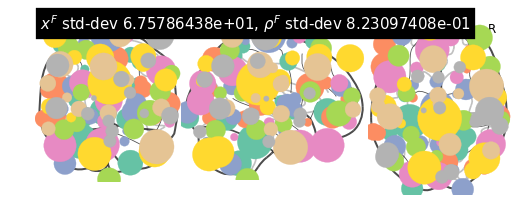

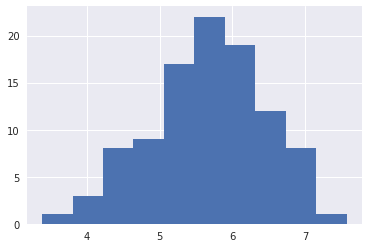

(<nilearn.plotting.displays.OrthoProjector at 0x7f23c4f6a748>,
 tensor([[-2.7322e+01, -1.0521e+02, -7.8465e+00],
         [ 5.1537e+01,  5.2612e+00, -3.0973e+00],
         [-5.1652e+00,  4.1332e+01, -1.9744e+00],
         [-2.4750e+01, -2.8386e+01,  4.2403e+01],
         [ 2.3173e+01, -5.1725e+01, -5.5894e+01],
         [ 2.3477e+01, -5.6495e+01,  5.7589e+01],
         [-2.9955e+01, -3.4969e+01, -3.3030e+01],
         [-2.3364e-01,  2.6245e+01,  7.2523e+01],
         [-3.4976e+01, -7.3049e+00,  8.8916e+00],
         [ 3.0743e+01, -5.0490e+01,  2.4353e+01],
         [ 2.0051e+01, -6.4345e+01, -9.9520e+00],
         [ 3.3944e+01,  4.0934e-01,  5.1201e+01],
         [-5.0811e+01, -4.7470e+01,  6.7300e+01],
         [ 8.1264e+00, -7.7587e+01,  5.3494e+01],
         [-2.6543e+01, -9.4583e+00,  3.2118e+01],
         [-5.6460e+01,  4.6679e+01, -7.4695e+00],
         [ 2.7317e+01,  6.2279e+01,  1.1628e+01],
         [ 3.6618e+01, -8.3147e+01,  2.1560e+01],
         [ 3.4258e+01,  3.9672e+01,  

In [9]:
dtfa.visualize_factor_embedding()

In [10]:
def subject_labeler(subject):
    subject_regex = re.compile("([A-Za-z]+)([0-9]{1,2})")
    m = subject_regex.search(subject)
    condition, sub_num = m.groups()
    if condition == 'mdd':
        condition = 'Major Depressive'
    elif condition == 'control':
        condition = 'Control'
    return '%s Participant %d' % (condition, int(sub_num))

In [11]:
def task_labeler(task):
    if task == 'negative_music':
        task = 'Negative music'
    elif task == 'positive_music':
        task = 'Positive music'
    elif task == 'negative_nonmusic':
        task = 'Negative sounds'
    elif task == 'positive_nonmusic':
        task = 'Positive sounds'
    else:
        task = task.capitalize()
    return task

In [12]:
def lepping_2017_labeler(block):
    task = task_labeler(block.task)
    return task + ' stimulus'

In [13]:
validation_filter = lepping_db.inference_filter(training=False)
validation_blocks = [b for (b, block) in enumerate(dtfa._blocks) if validation_filter(block)]

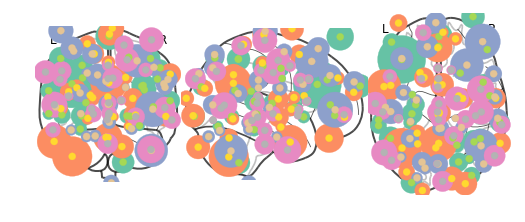

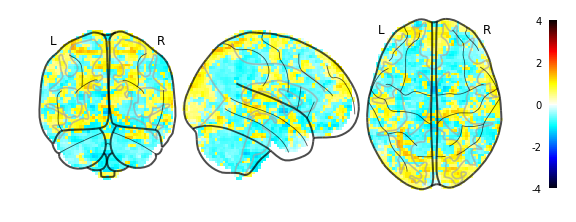

09/29/2019 15:16:47 Reconstruction Error (Frobenius Norm): 5.02776123e+02 out of 5.74926392e+02


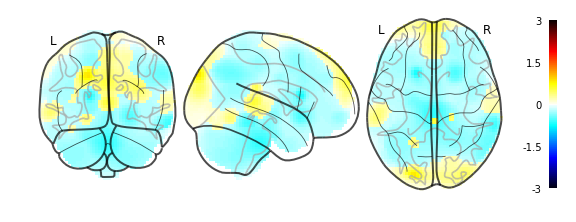

09/29/2019 15:16:48 Reconstruction Error (Frobenius Norm): 5.02776123e+02 out of 5.74926392e+02


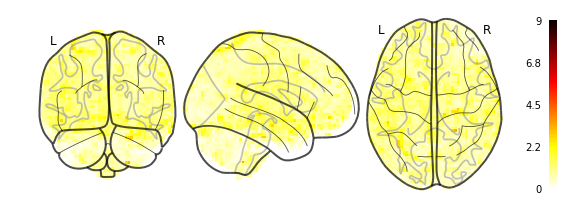

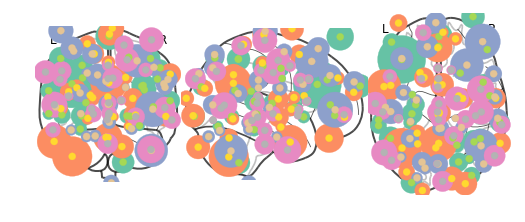

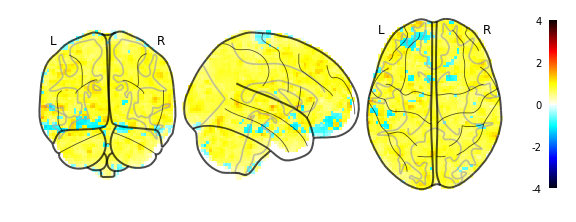

09/29/2019 15:16:52 Reconstruction Error (Frobenius Norm): 5.34126526e+02 out of 6.87497009e+02


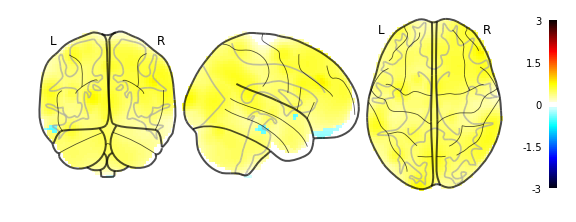

09/29/2019 15:16:54 Reconstruction Error (Frobenius Norm): 5.34126526e+02 out of 6.87497009e+02


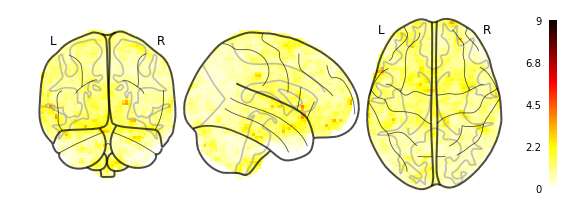

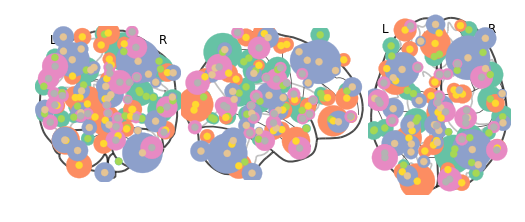

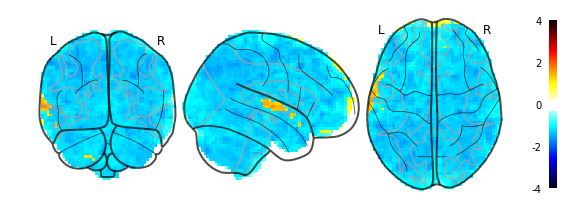

09/29/2019 15:16:58 Reconstruction Error (Frobenius Norm): 5.15528381e+02 out of 9.26606873e+02


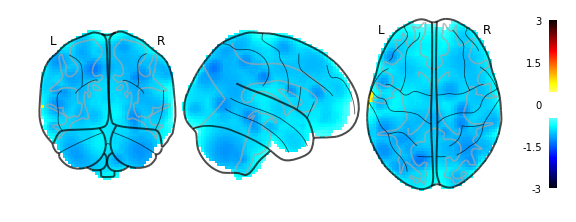

09/29/2019 15:16:59 Reconstruction Error (Frobenius Norm): 5.15528381e+02 out of 9.26606873e+02


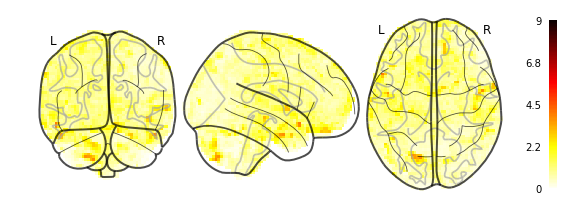

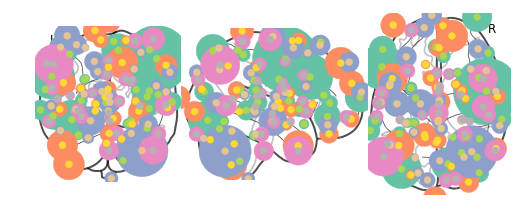

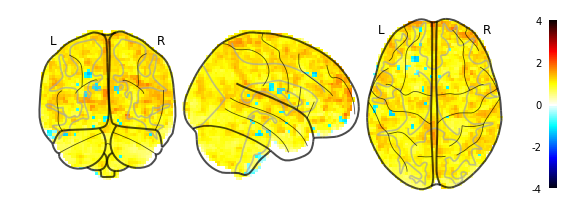

09/29/2019 15:17:03 Reconstruction Error (Frobenius Norm): 6.02412659e+02 out of 8.05481567e+02


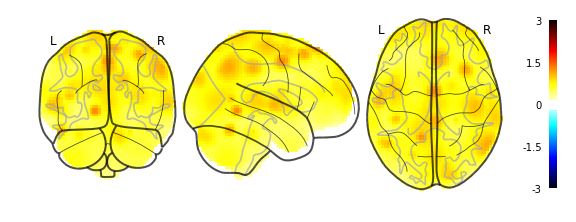

09/29/2019 15:17:05 Reconstruction Error (Frobenius Norm): 6.02412659e+02 out of 8.05481567e+02


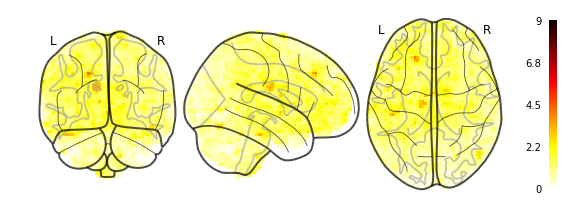

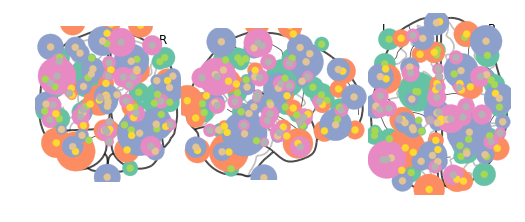

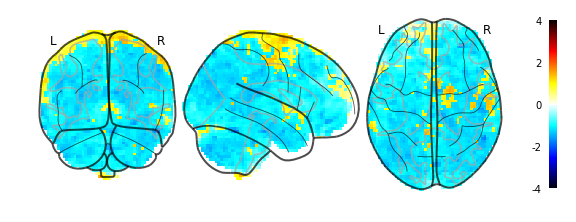

09/29/2019 15:17:09 Reconstruction Error (Frobenius Norm): 5.39294556e+02 out of 8.03103760e+02


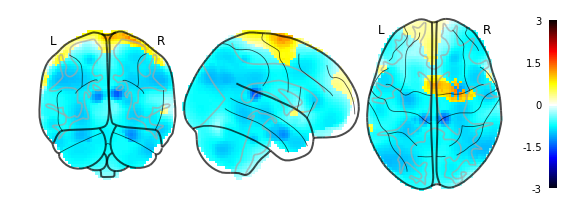

09/29/2019 15:17:11 Reconstruction Error (Frobenius Norm): 5.39294556e+02 out of 8.03103760e+02


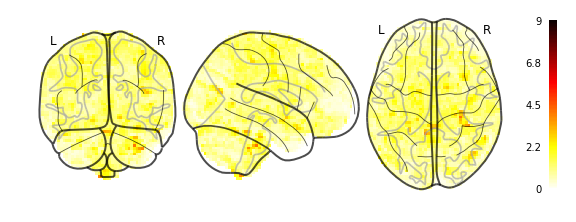

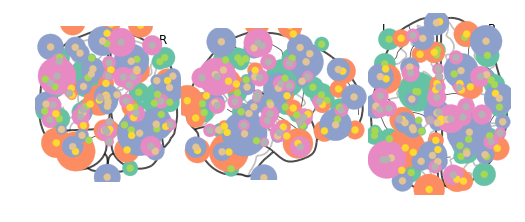

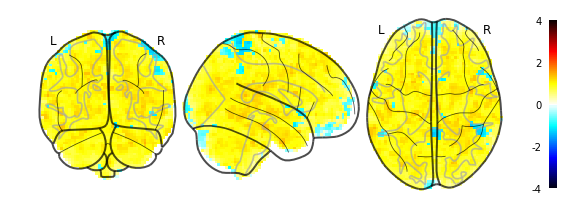

09/29/2019 15:17:14 Reconstruction Error (Frobenius Norm): 5.91643738e+02 out of 8.10350403e+02


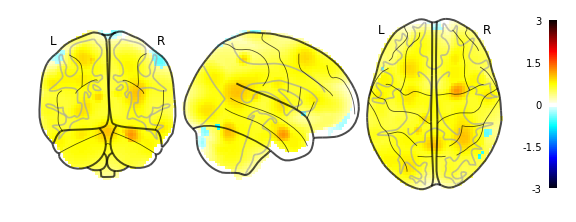

09/29/2019 15:17:16 Reconstruction Error (Frobenius Norm): 5.91643738e+02 out of 8.10350403e+02


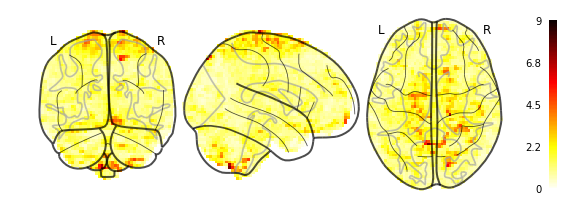

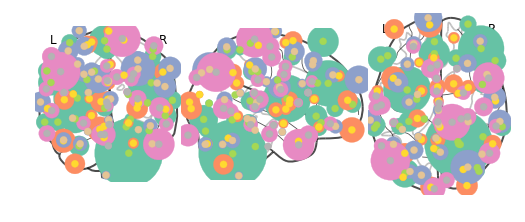

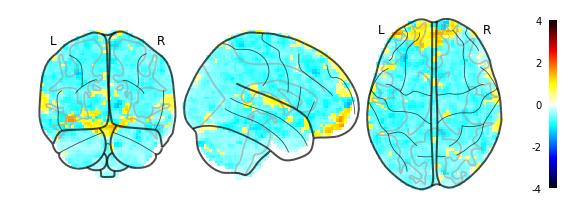

09/29/2019 15:17:20 Reconstruction Error (Frobenius Norm): 4.51583008e+02 out of 5.29257202e+02


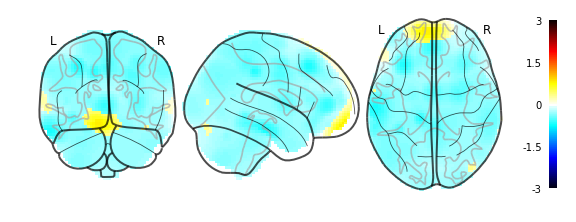

09/29/2019 15:17:22 Reconstruction Error (Frobenius Norm): 4.51583008e+02 out of 5.29257202e+02


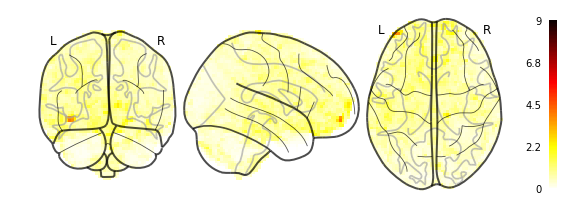

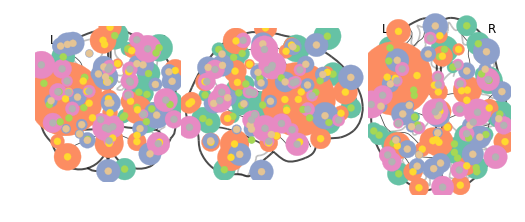

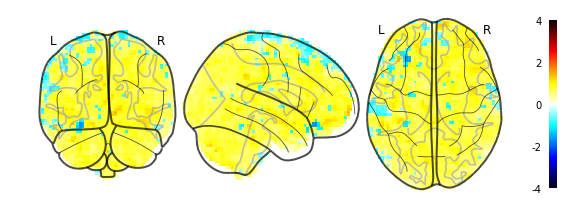

09/29/2019 15:17:26 Reconstruction Error (Frobenius Norm): 5.70423645e+02 out of 7.51277771e+02


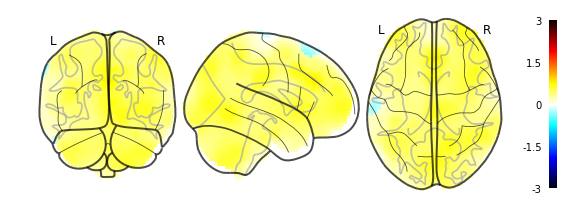

09/29/2019 15:17:27 Reconstruction Error (Frobenius Norm): 5.70423645e+02 out of 7.51277771e+02


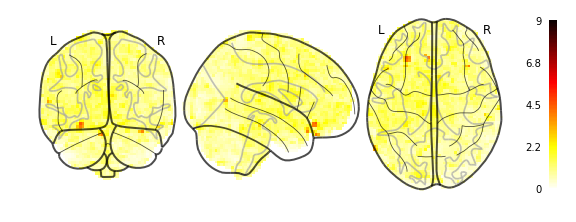

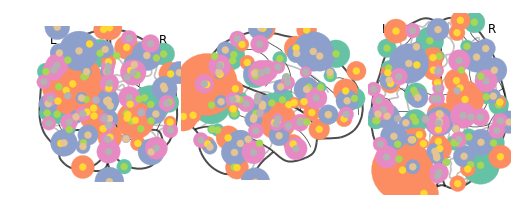

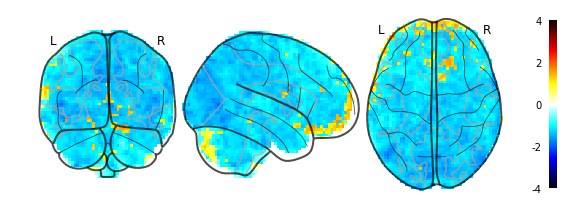

09/29/2019 15:17:31 Reconstruction Error (Frobenius Norm): 6.21701904e+02 out of 9.18257507e+02


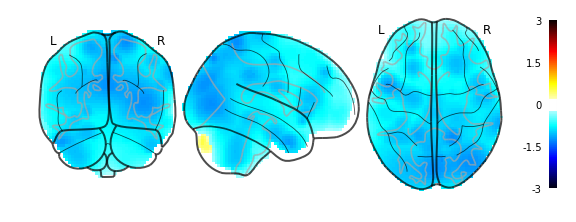

09/29/2019 15:17:33 Reconstruction Error (Frobenius Norm): 6.21701904e+02 out of 9.18257507e+02


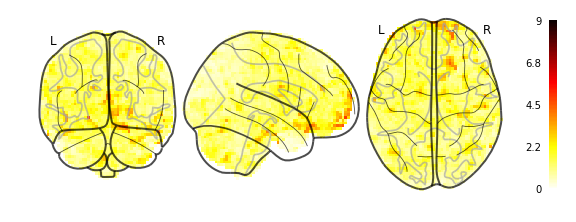

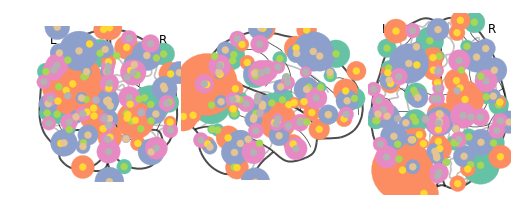

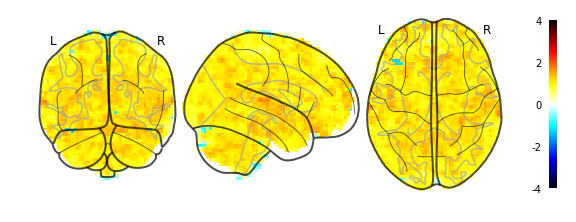

09/29/2019 15:17:37 Reconstruction Error (Frobenius Norm): 6.13696838e+02 out of 8.56945679e+02


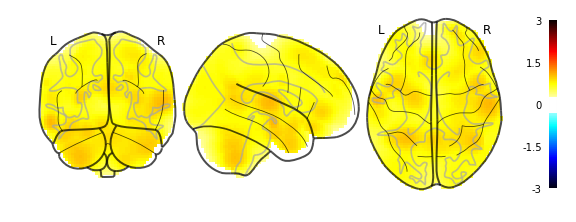

09/29/2019 15:17:38 Reconstruction Error (Frobenius Norm): 6.13696838e+02 out of 8.56945679e+02


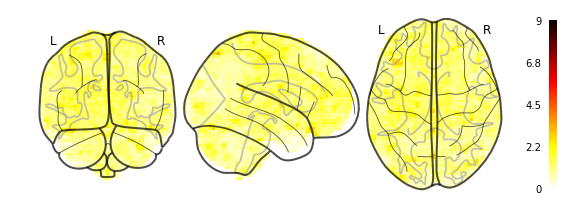

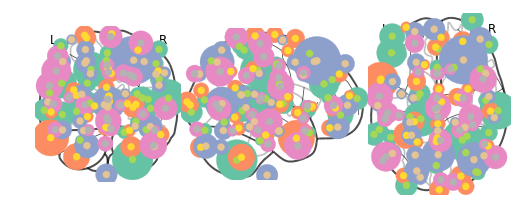

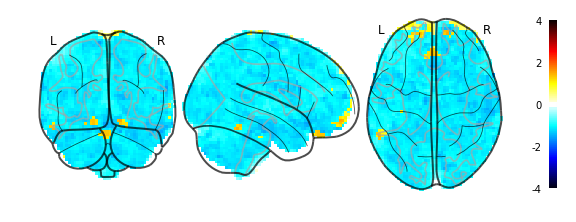

09/29/2019 15:17:42 Reconstruction Error (Frobenius Norm): 4.85879272e+02 out of 7.80868469e+02


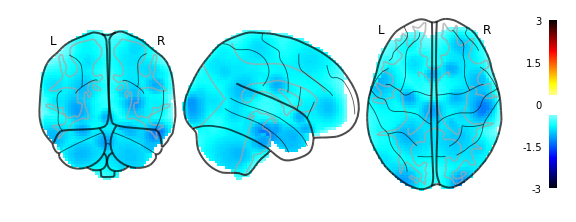

09/29/2019 15:17:44 Reconstruction Error (Frobenius Norm): 4.85879272e+02 out of 7.80868469e+02


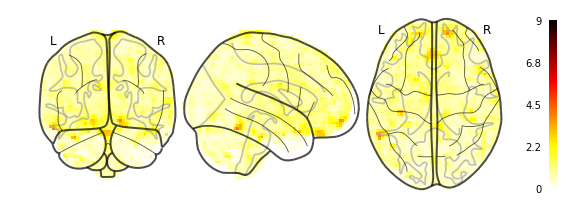

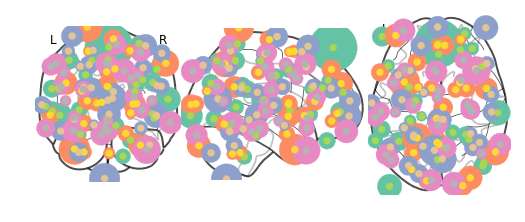

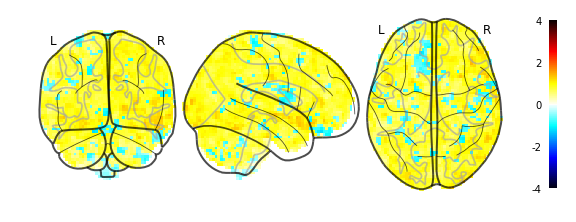

09/29/2019 15:17:48 Reconstruction Error (Frobenius Norm): 7.02038696e+02 out of 7.84109863e+02


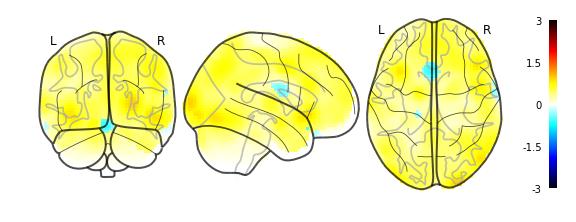

09/29/2019 15:17:49 Reconstruction Error (Frobenius Norm): 7.02038696e+02 out of 7.84109863e+02


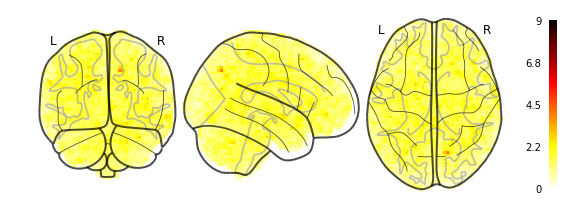

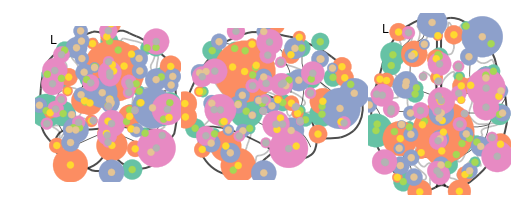

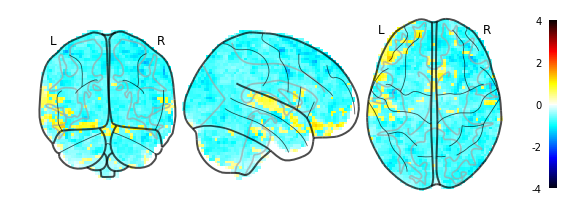

09/29/2019 15:17:53 Reconstruction Error (Frobenius Norm): 4.72808319e+02 out of 6.30471802e+02


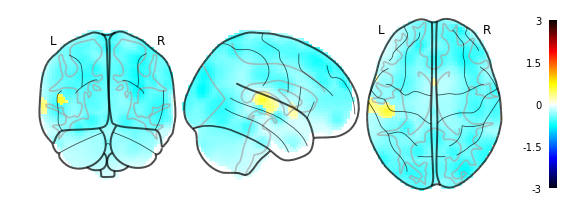

09/29/2019 15:17:55 Reconstruction Error (Frobenius Norm): 4.72808319e+02 out of 6.30471802e+02


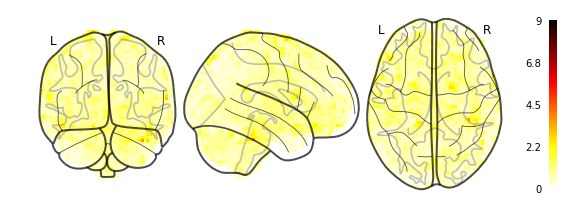

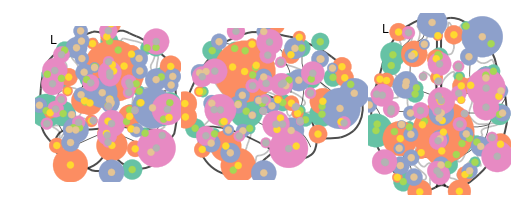

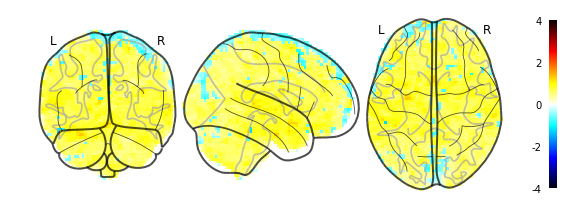

09/29/2019 15:17:59 Reconstruction Error (Frobenius Norm): 4.64259003e+02 out of 6.29985840e+02


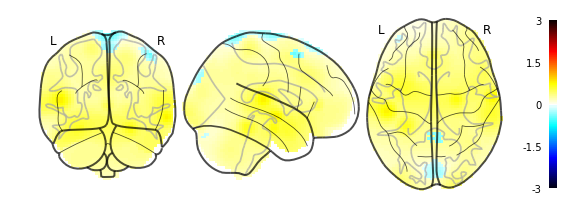

09/29/2019 15:18:01 Reconstruction Error (Frobenius Norm): 4.64259003e+02 out of 6.29985840e+02


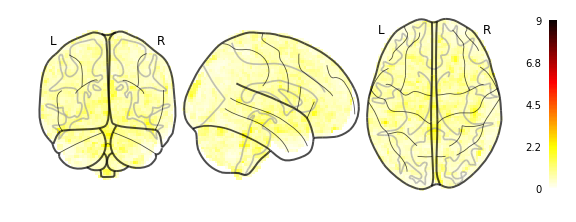

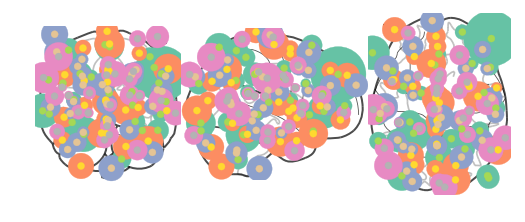

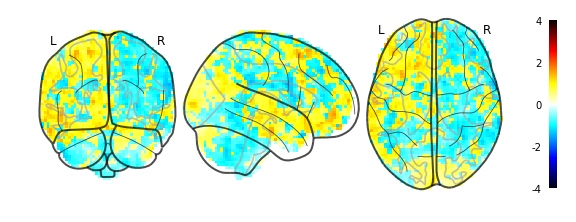

09/29/2019 15:18:05 Reconstruction Error (Frobenius Norm): 6.97683777e+02 out of 8.19677063e+02


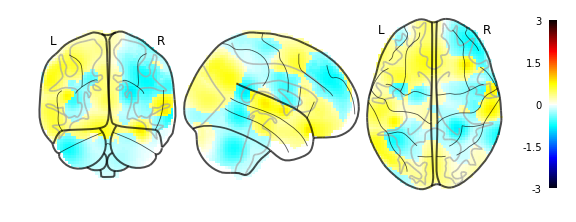

09/29/2019 15:18:06 Reconstruction Error (Frobenius Norm): 6.97683777e+02 out of 8.19677063e+02


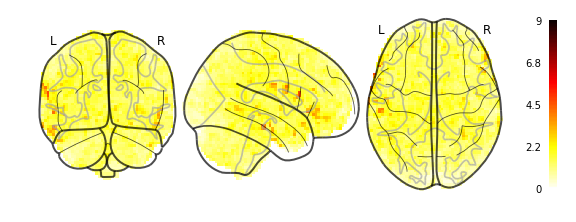

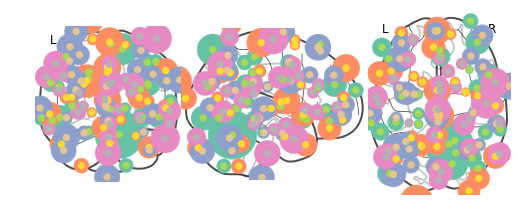

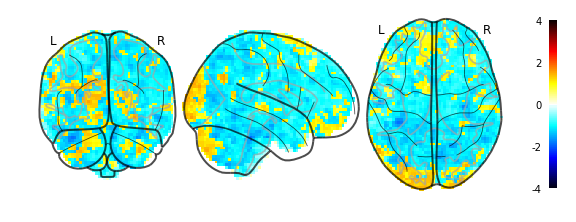

09/29/2019 15:18:10 Reconstruction Error (Frobenius Norm): 7.44088806e+02 out of 8.65307983e+02


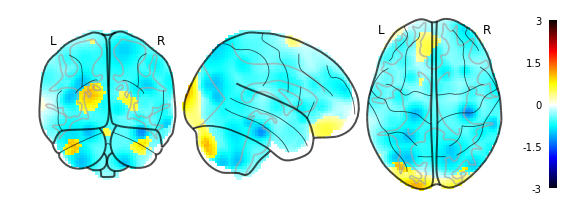

09/29/2019 15:18:12 Reconstruction Error (Frobenius Norm): 7.44088806e+02 out of 8.65307983e+02


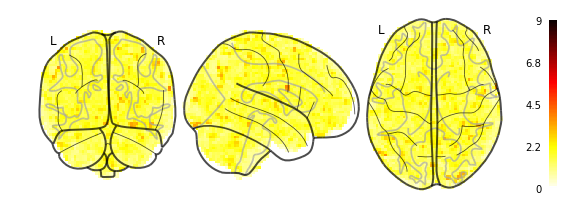

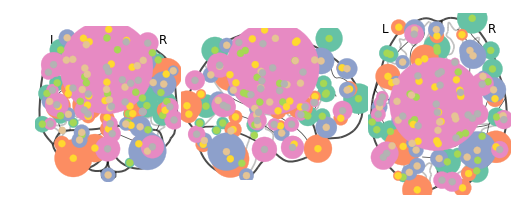

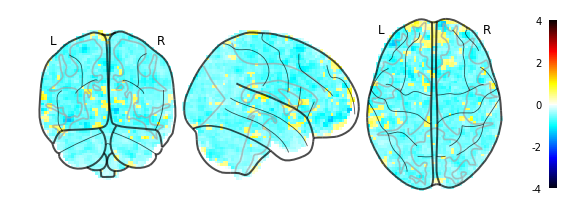

09/29/2019 15:18:16 Reconstruction Error (Frobenius Norm): 5.38503723e+02 out of 6.11537109e+02


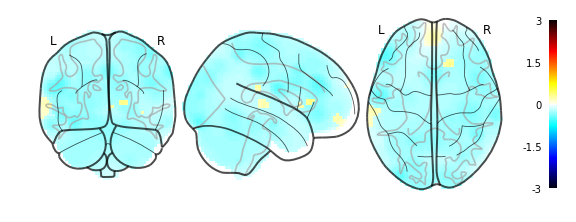

09/29/2019 15:18:17 Reconstruction Error (Frobenius Norm): 5.38503723e+02 out of 6.11537109e+02


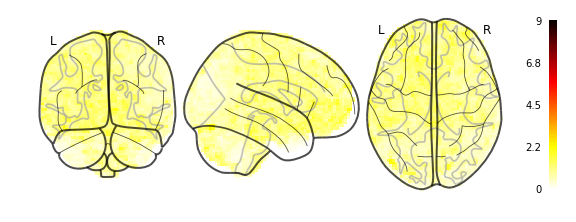

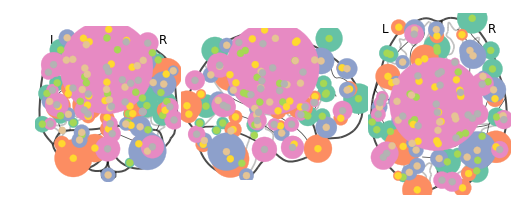

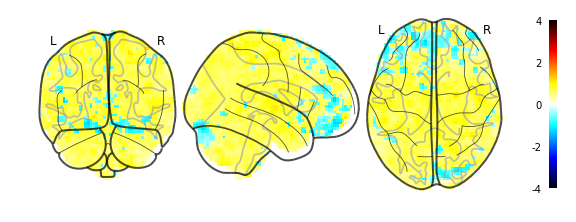

09/29/2019 15:18:21 Reconstruction Error (Frobenius Norm): 5.27265198e+02 out of 6.20750854e+02


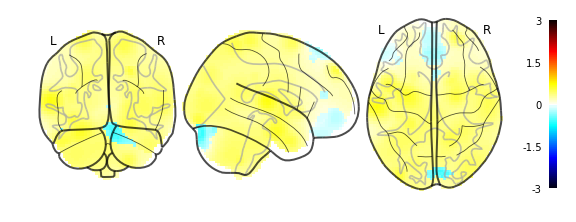

09/29/2019 15:18:23 Reconstruction Error (Frobenius Norm): 5.27265198e+02 out of 6.20750854e+02


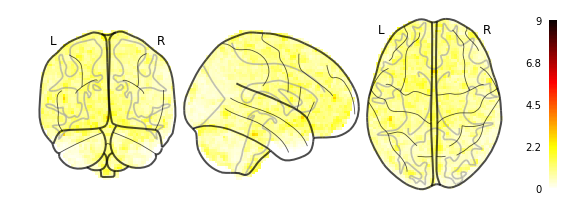

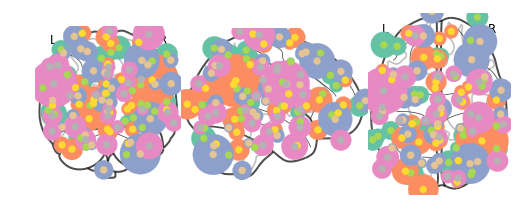

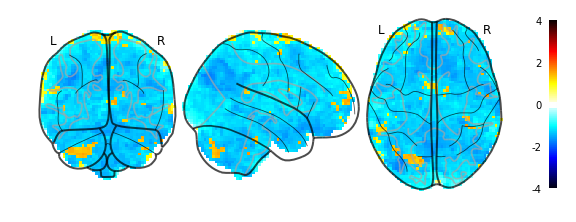

09/29/2019 15:18:27 Reconstruction Error (Frobenius Norm): 5.12767395e+02 out of 8.78814453e+02


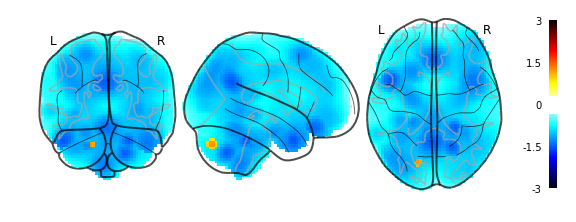

09/29/2019 15:18:29 Reconstruction Error (Frobenius Norm): 5.12767395e+02 out of 8.78814453e+02


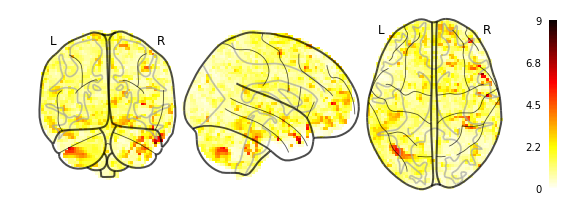

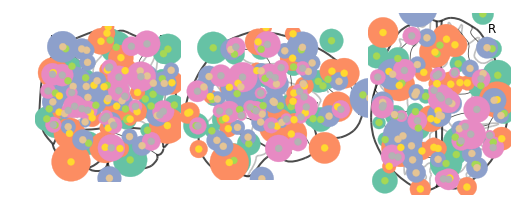

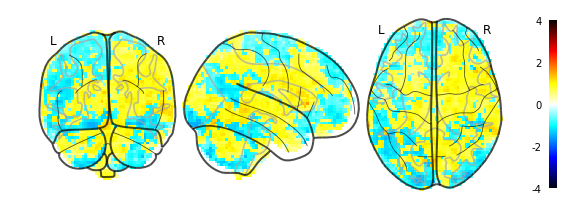

09/29/2019 15:18:33 Reconstruction Error (Frobenius Norm): 5.97470154e+02 out of 7.76536804e+02


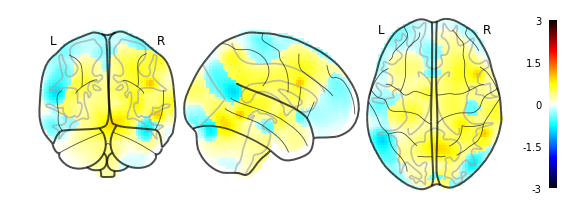

09/29/2019 15:18:34 Reconstruction Error (Frobenius Norm): 5.97470154e+02 out of 7.76536804e+02


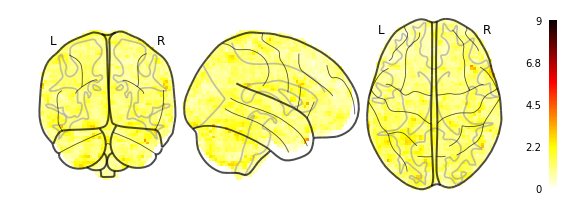

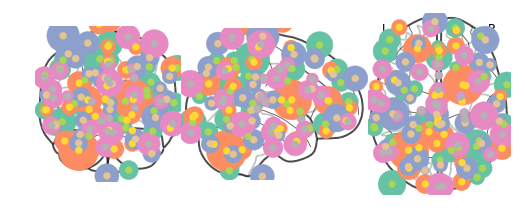

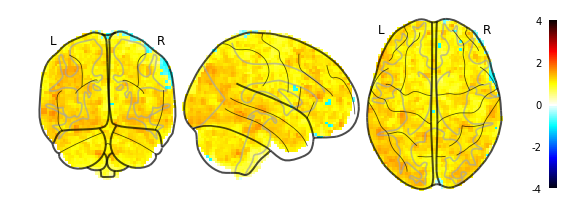

09/29/2019 15:18:38 Reconstruction Error (Frobenius Norm): 6.19514221e+02 out of 8.91481262e+02


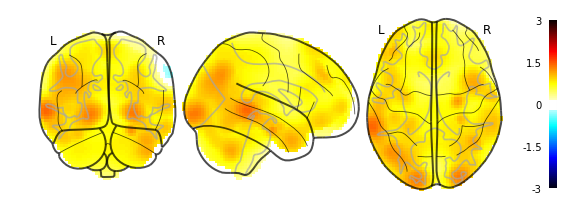

09/29/2019 15:18:40 Reconstruction Error (Frobenius Norm): 6.19514221e+02 out of 8.91481262e+02


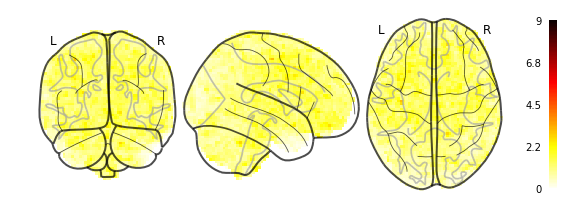

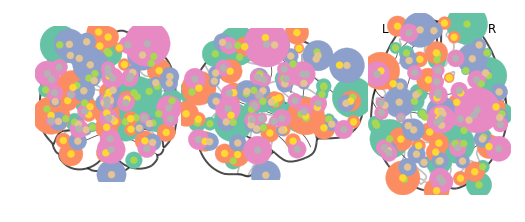

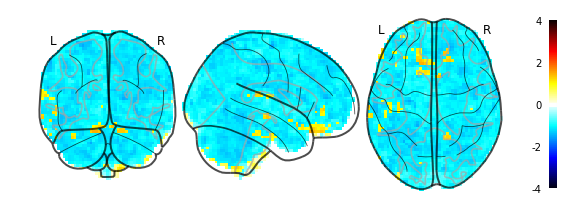

09/29/2019 15:18:44 Reconstruction Error (Frobenius Norm): 5.43770264e+02 out of 8.88662109e+02


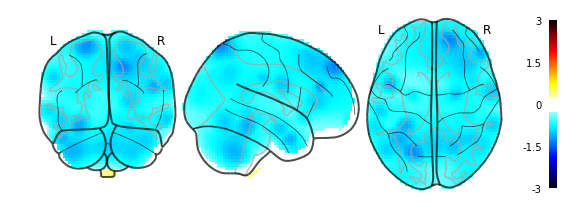

09/29/2019 15:18:46 Reconstruction Error (Frobenius Norm): 5.43770264e+02 out of 8.88662109e+02


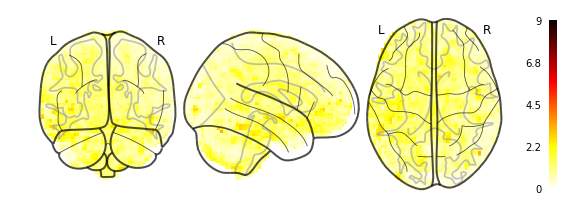

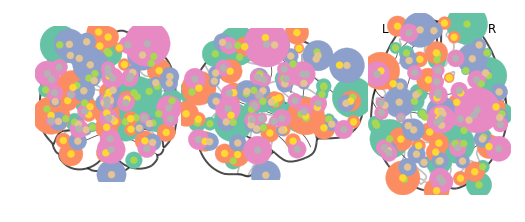

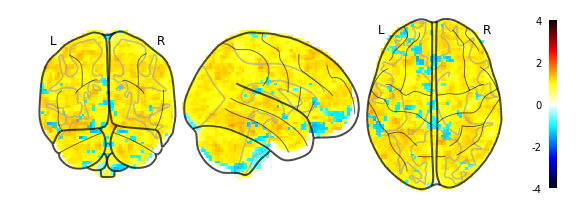

09/29/2019 15:18:50 Reconstruction Error (Frobenius Norm): 6.26259216e+02 out of 9.56629761e+02


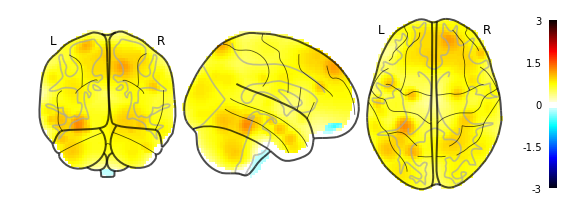

09/29/2019 15:18:51 Reconstruction Error (Frobenius Norm): 6.26259216e+02 out of 9.56629761e+02


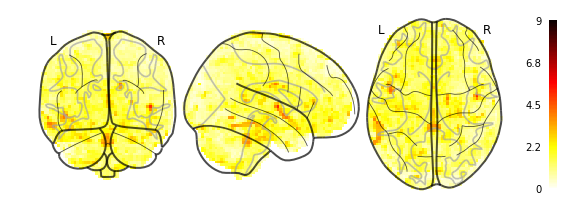

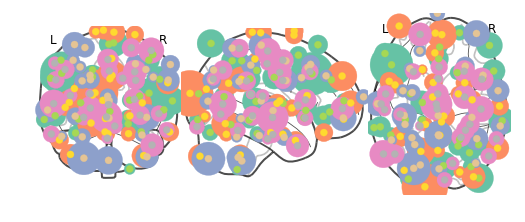

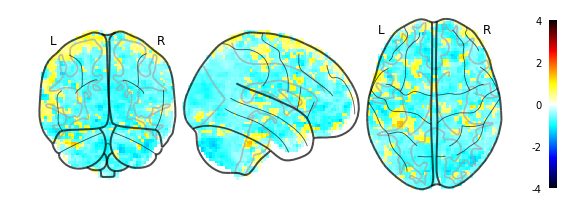

09/29/2019 15:18:55 Reconstruction Error (Frobenius Norm): 5.00565155e+02 out of 6.09348572e+02


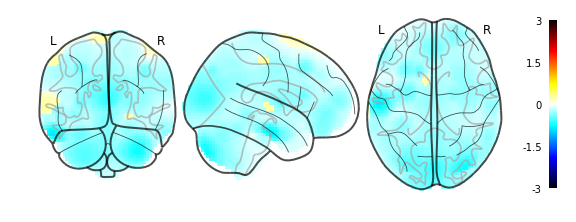

09/29/2019 15:18:57 Reconstruction Error (Frobenius Norm): 5.00565155e+02 out of 6.09348572e+02


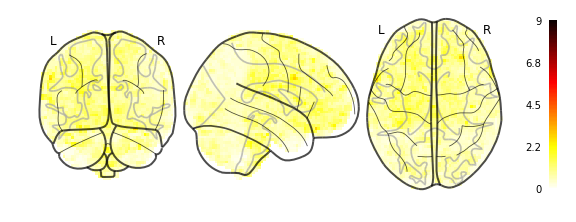

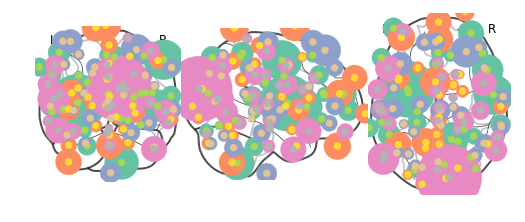

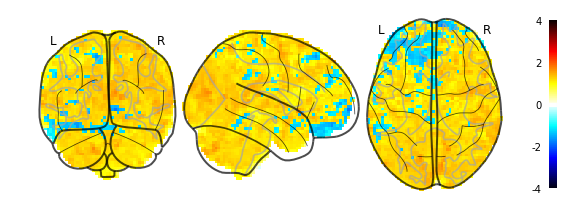

09/29/2019 15:19:01 Reconstruction Error (Frobenius Norm): 6.68453674e+02 out of 9.09648376e+02


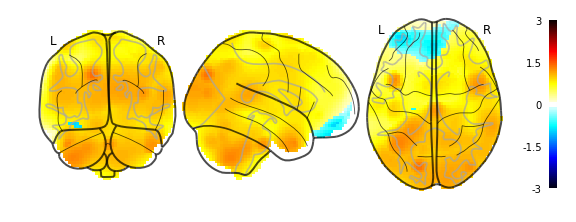

09/29/2019 15:19:02 Reconstruction Error (Frobenius Norm): 6.68453674e+02 out of 9.09648376e+02


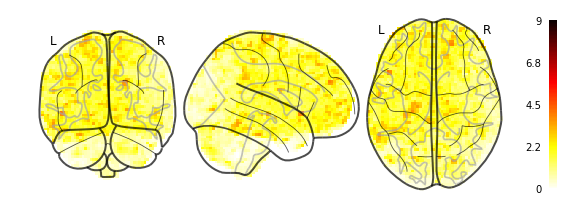

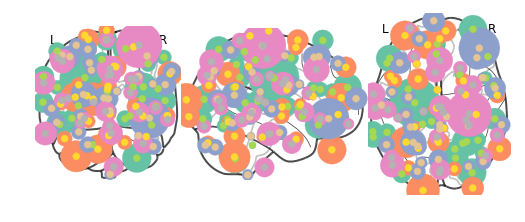

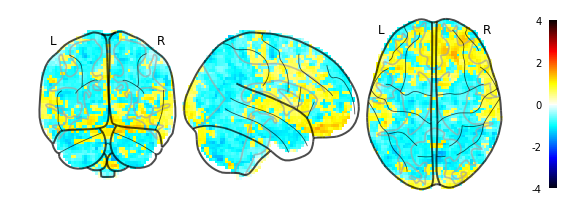

09/29/2019 15:19:06 Reconstruction Error (Frobenius Norm): 4.97402344e+02 out of 5.75360840e+02


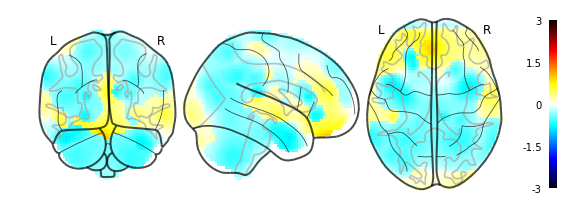

09/29/2019 15:19:08 Reconstruction Error (Frobenius Norm): 4.97402344e+02 out of 5.75360840e+02


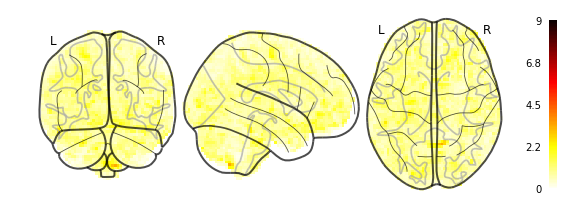

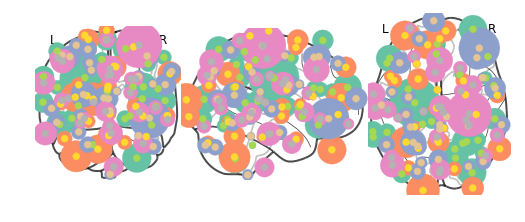

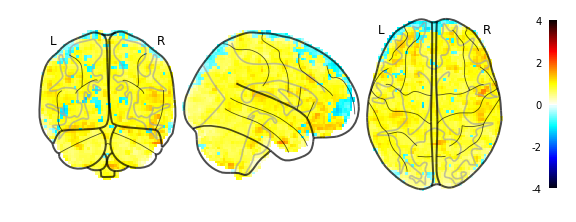

09/29/2019 15:19:12 Reconstruction Error (Frobenius Norm): 4.74589447e+02 out of 6.22596130e+02


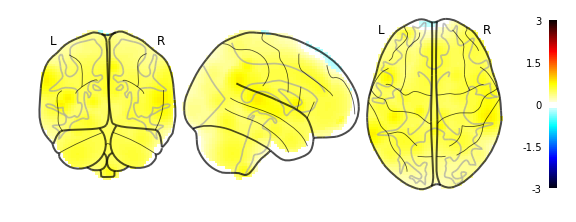

09/29/2019 15:19:14 Reconstruction Error (Frobenius Norm): 4.74589447e+02 out of 6.22596130e+02


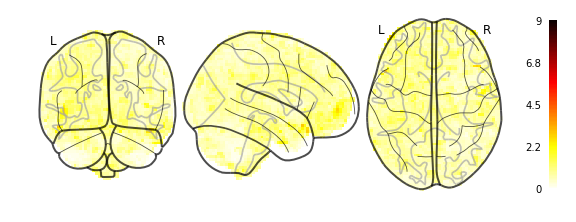

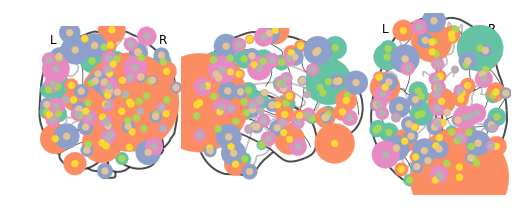

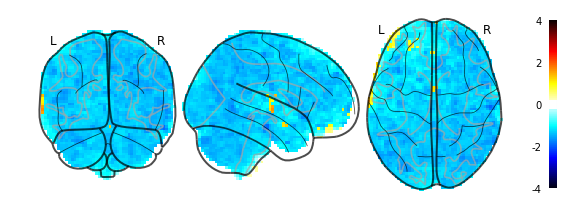

09/29/2019 15:19:17 Reconstruction Error (Frobenius Norm): 5.57368469e+02 out of 9.46378418e+02


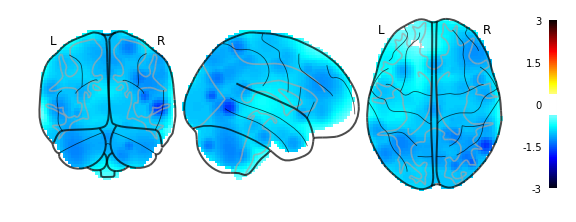

09/29/2019 15:19:19 Reconstruction Error (Frobenius Norm): 5.57368469e+02 out of 9.46378418e+02


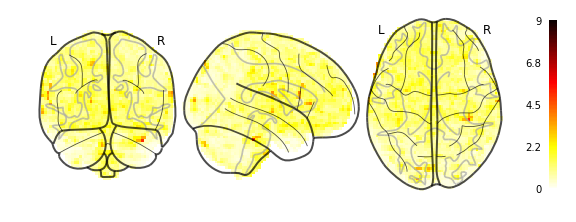

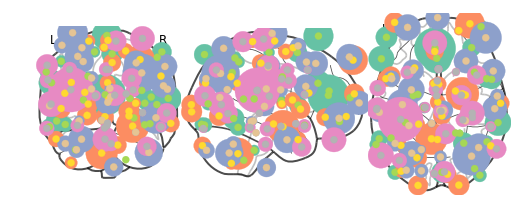

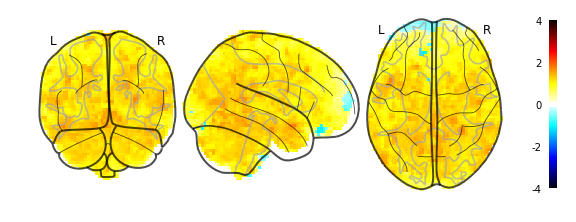

09/29/2019 15:19:23 Reconstruction Error (Frobenius Norm): 5.68745361e+02 out of 9.01897156e+02


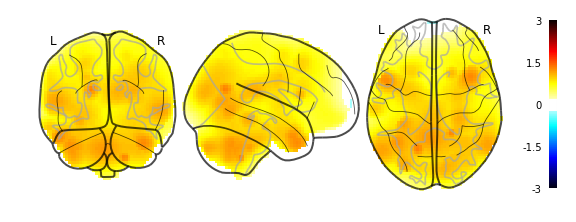

09/29/2019 15:19:25 Reconstruction Error (Frobenius Norm): 5.68745361e+02 out of 9.01897156e+02


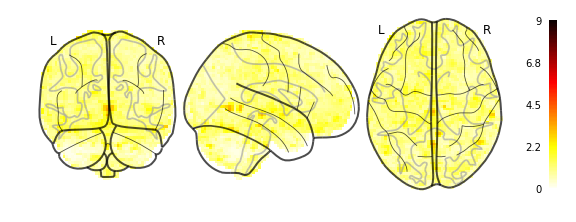

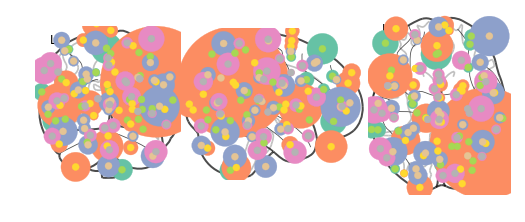

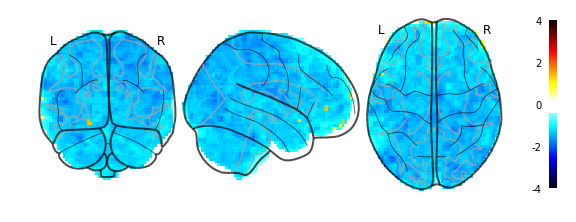

09/29/2019 15:19:29 Reconstruction Error (Frobenius Norm): 5.24393738e+02 out of 9.71673279e+02


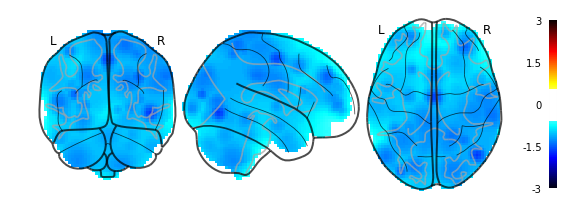

09/29/2019 15:19:30 Reconstruction Error (Frobenius Norm): 5.24393738e+02 out of 9.71673279e+02


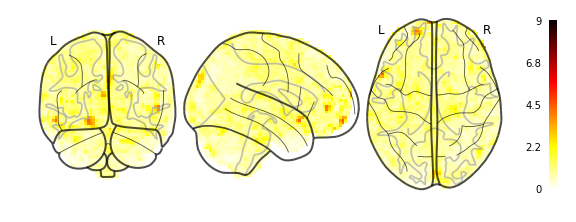

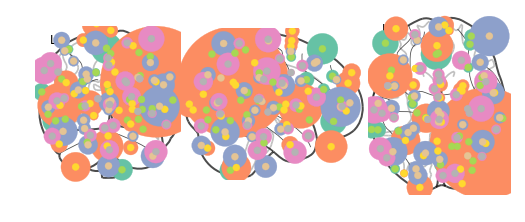

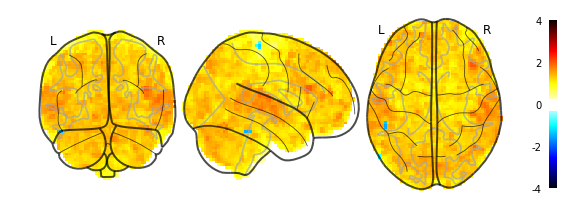

09/29/2019 15:19:34 Reconstruction Error (Frobenius Norm): 5.54194397e+02 out of 9.52562500e+02


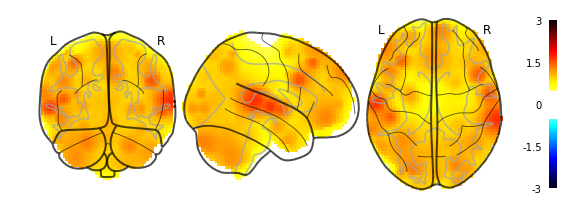

09/29/2019 15:19:36 Reconstruction Error (Frobenius Norm): 5.54194397e+02 out of 9.52562500e+02


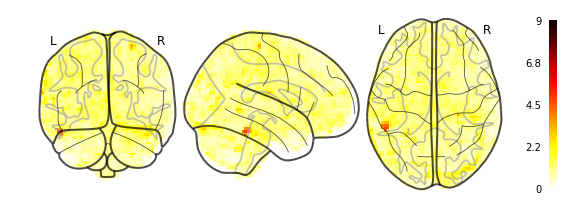

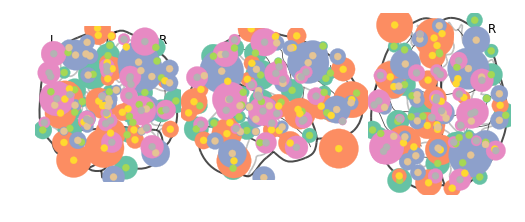

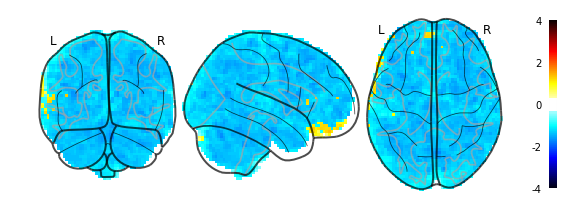

09/29/2019 15:19:40 Reconstruction Error (Frobenius Norm): 4.92363434e+02 out of 9.46298950e+02


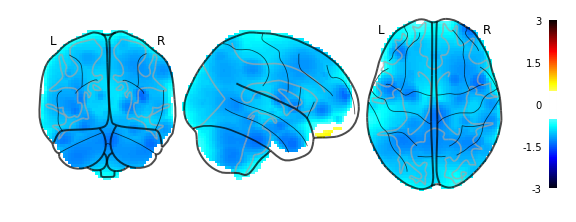

09/29/2019 15:19:41 Reconstruction Error (Frobenius Norm): 4.92363434e+02 out of 9.46298950e+02


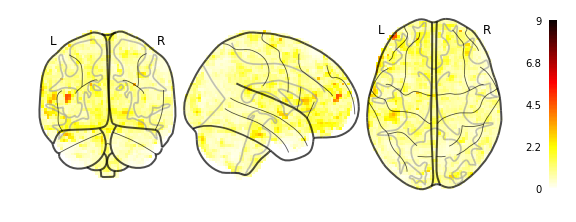

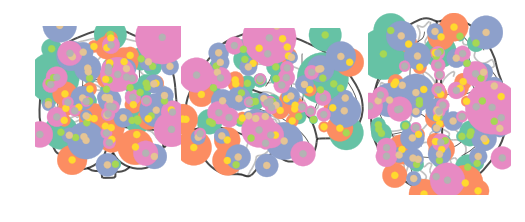

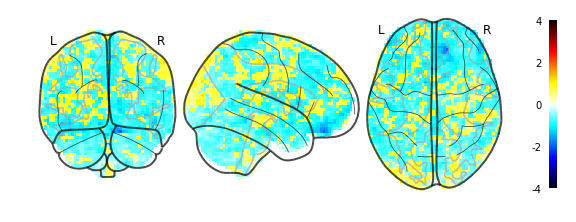

09/29/2019 15:19:45 Reconstruction Error (Frobenius Norm): 7.41813843e+02 out of 8.64134399e+02


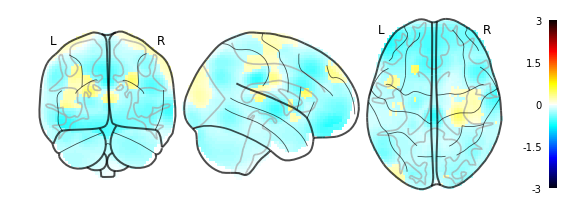

09/29/2019 15:19:47 Reconstruction Error (Frobenius Norm): 7.41813843e+02 out of 8.64134399e+02


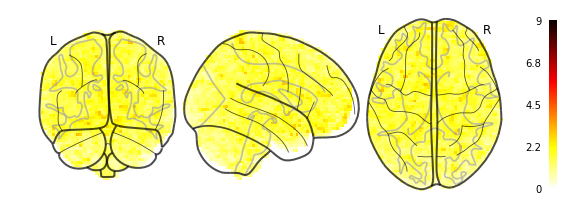

In [14]:
for index in validation_blocks[0:-1:3]:
    dtfa.plot_factor_centers(index)
    dtfa.plot_original_brain(index, labeler=lambda b: None, zscore_bound=4., t=None)
    dtfa.plot_reconstruction(index, labeler=lambda b: None, t=None)
    dtfa.plot_reconstruction_diff(index, labeler=lambda b: None, t=None)

/home/eli/anaconda3/envs/HTFATorch/lib/python3.6/site-packages/matplotlib/figure.py:445: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  % get_backend())


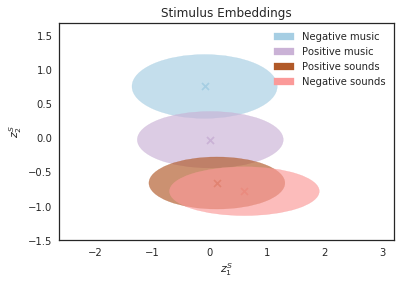

In [15]:
dtfa.scatter_task_embedding(labeler=task_labeler, colormap='Paired', figsize=None,
                            filename='lepping_2017_noresponse-task_embedding.pdf',
                            legend_ordering=[0, 2, 3, 1])

/home/eli/anaconda3/envs/HTFATorch/lib/python3.6/site-packages/matplotlib/figure.py:445: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  % get_backend())


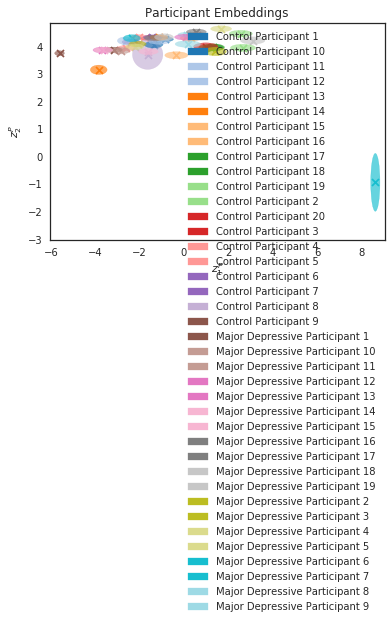

In [16]:
dtfa.scatter_subject_embedding(labeler=subject_labeler, figsize=None, colormap='tab20')

In [17]:
dtfa.average_reconstruction_error()

09/29/2019 15:20:23 Average reconstruction error (MSE): 6.66188646e-01
09/29/2019 15:20:23 Average data norm (Euclidean): 9.28131280e-01
09/29/2019 15:20:23 Percent average reconstruction error: 0.276637


(0.6661886456621529, 0.9281312803800874, 0.0027663744519918912)

In [18]:
dtfa.average_reconstruction_error(weighted=False)

09/29/2019 15:20:57 Average reconstruction error (MSE): 5.71713060e+02 +/- 8.78179494e+01
09/29/2019 15:20:57 Average data norm (Euclidean): 7.93378331e+02 +/- 1.40920715e+02
09/29/2019 15:20:57 Percent average reconstruction error: 73.438205 +/- 1.20671715e+01


(array([ 522.23730469,  526.5614624 ,  549.54650879,  534.86480713,
         636.4486084 ,  518.77050781,  532.71661377,  559.20111084,
         536.19281006,  529.99578857,  530.37200928,  533.52661133,
         517.92724609,  530.98059082,  548.51733398,  538.1708374 ,
         588.98840332,  577.31958008,  584.25286865,  588.65203857,
         604.25964355,  617.28131104,  588.73217773,  645.30059814,
         600.68115234,  583.70635986,  598.02325439,  644.62322998,
         571.97802734,  640.78942871,  581.69482422,  579.28363037,
         543.51617432,  502.77612305,  534.56054688,  557.58154297,
         484.23101807,  521.27960205,  534.12652588,  513.4163208 ,
         571.28210449,  559.09832764,  530.04412842,  545.7175293 ,
         550.41259766,  515.31915283,  616.68487549,  513.29168701,
         528.80389404,  518.79766846,  493.76745605,  513.98822021,
         515.52838135,  501.03277588,  519.58447266,  502.58831787,
         584.44445801,  535.25415039,  533.20501

In [19]:
def condition_labeler(subject):
    subject_regex = re.compile("([A-Za-z]+)([0-9]{1,2})")
    m = subject_regex.search(subject)
    condition, sub_num = m.groups()
    if condition == 'mdd':
        return 'Major Depressive'
    elif condition == 'control':
        return 'Control'
    return condition

/home/eli/anaconda3/envs/HTFATorch/lib/python3.6/site-packages/matplotlib/figure.py:445: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  % get_backend())


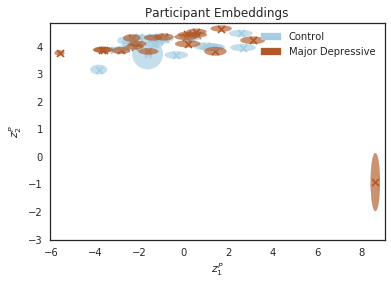

In [20]:
dtfa.scatter_subject_embedding(labeler=condition_labeler, colormap='Paired', figsize=None,
                               filename='lepping_2017_noresponse-subject_embedding.pdf')

In [21]:
dtfa.free_energy(batch_size=50, use_cuda=False, blocks_batch_size=15, num_particles=1, sample_size=100,
                 blocks_filter=lepping_db.inference_filter(training=True))

[[407198720.0, -405684832.0, 1513854.75],
 [407226176.0, -405650496.0, 1515013.5]]

In [22]:
dtfa.free_energy(batch_size=50, use_cuda=False, blocks_batch_size=15, num_particles=1, sample_size=100,
                 blocks_filter=lepping_db.inference_filter(training=False))

[[77831208.0, -77557088.0, 274130.90625],
 [77857736.0, -77536792.0, 274929.0625]]